<a href="https://colab.research.google.com/github/PhantomPheonix02/ICTAK-DSA_Assignments/blob/main/EXITTEST_ASWINI_N.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
#import necessary libraries that need to be used

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [2]:
#read the csv file
data = pd.read_csv('/content/train_exit.csv')

In [3]:
#to know Size of Dataframe
data.shape

(13994, 30)

In [4]:
# to know Data types of columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13994 entries, 0 to 13993
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   player_id                  13994 non-null  object 
 1   name                       13994 non-null  object 
 2   age                        13994 non-null  int64  
 3   gender                     13975 non-null  object 
 4   country                    13994 non-null  object 
 5   height                     13994 non-null  object 
 6   weight                     13577 non-null  object 
 7   ball_controlling_skills    13581 non-null  float64
 8   body_reflexes              13994 non-null  float64
 9   body_balance               13994 non-null  float64
 10  jumping_skills             13970 non-null  float64
 11  penalties_conversion_rate  13964 non-null  float64
 12  mental_strength            13966 non-null  float64
 13  goalkeeping_skills         13994 non-null  flo

In [5]:
#to get the last 4 rows of the dataset
data.tail(4)

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
13990,PLID_17290,Illa Pitre,18,F,England,5'10,165lbs,53.0,68.0,59.0,...,Right,5.3,0.0,5.6,3.0,Medium,Academy,4.0,0.0,0
13991,PLID_5193,Marylouise Mosley,17,M,Japan,6'0,172lbs,56.0,73.0,62.0,...,Left,5.7,0.0,7.7,3.0,Low,Talent Hunt,2.0,0.0,1
13992,PLID_12173,Teri Escamilla,20,F,Ukraine,5'10,150lbs,71.0,69.0,70.0,...,Left,6.8,1.0,5.8,4.0,Medium,Academy,6.0,0.0,1
13993,PLID_236,Darius Schuman,16,F,Chile,5'8,159lbs,53.0,59.0,67.0,...,Right,4.2,0.0,6.7,0.0,Medium,Source,1.0,0.0,0


In [6]:
# If we want to see only the variable names,then we can use the .columns method to get all the names.

data.columns

Index(['player_id', 'name', 'age', 'gender', 'country', 'height', 'weight',
       'ball_controlling_skills', 'body_reflexes', 'body_balance',
       'jumping_skills', 'penalties_conversion_rate', 'mental_strength',
       'goalkeeping_skills', 'defending_skills', 'passing_skills',
       'dribbling_skills', 'shot_accuracy', 'body_strength_stamina',
       'max_running_speed', 'strong_foot', 'behaviour_rating',
       'matches_played', 'fitness_rating', 'trophies_won', 'dedication_level',
       'coaching', 'years_of_experience', 'no_of_disqualifications',
       'selection'],
      dtype='object')

In [94]:
#to know the representation of data
data.describe()

,age,ball_controlling_skills,body_reflexes,body_balance,jumping_skills,penalties_conversion_rate,mental_strength,goalkeeping_skills,defending_skills,passing_skills,...,dedication_level,years_of_experience,no_of_disqualifications,selection,gender_F,gender_M,coaching_Academy,coaching_Source,coaching_Talent Hunt,coaching_Unknown
count,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,1.399400e+04,...,13994.000000,1.399400e+04,1.399400e+04,1.399400e+04,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000
mean,1.624794e-17,-3.087109e-16,-2.063996e-16,-1.175437e-16,1.160204e-16,-6.712430e-16,-6.311309e-16,3.655787e-17,1.104352e-16,6.905375e-17,...,1.439260,6.499176e-17,7.870096e-18,1.086581e-16,0.499000,0.501000,0.679934,0.080463,0.142418,0.097185
std,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,...,0.868749,1.000036e+00,1.000036e+00,1.000036e+00,0.500017,0.500017,0.466518,0.272018,0.349491,0.296219
min,-9.948300e-01,-3.086620e+00,-3.344243e+00,-3.784611e+00,-4.159276e+00,-2.634642e+00,-3.992232e+00,-9.170724e-01,-2.324913e+00,-2.812140e+00,...,0.000000,-1.227271e+00,-1.380512e+01,-1.122503e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-8.011266e-01,-2.445375e-01,-5.313844e-01,-5.458883e-01,-5.543261e-01,-6.029006e-01,-6.492398e-01,-3.837058e-01,-7.198075e-01,-5.588212e-01,...,0.000000,-1.001427e+00,6.582343e-02,-1.122503e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-2.200167e-01,2.392212e-01,1.383438e-01,1.581818e-01,3.252623e-02,3.201878e-02,1.029336e-01,-3.244429e-01,2.313659e-01,2.157572e-01,...,2.000000,-9.805055e-02,6.582343e-02,8.908662e-01,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,5.547965e-01,6.625101e-01,6.741264e-01,7.214379e-01,7.032146e-01,7.304301e-01,6.879573e-01,-2.651799e-01,7.664010e-01,7.086707e-01,...,2.000000,8.053255e-01,6.582343e-02,8.908662e-01,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,7.721819e+00,2.355666e+00,2.281474e+00,2.411206e+00,2.631444e+00,2.762172e+00,2.944477e+00,4.238804e+00,2.252609e+00,2.539492e+00,...,2.000000,4.418830e+00,4.129440e-01,8.908662e-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


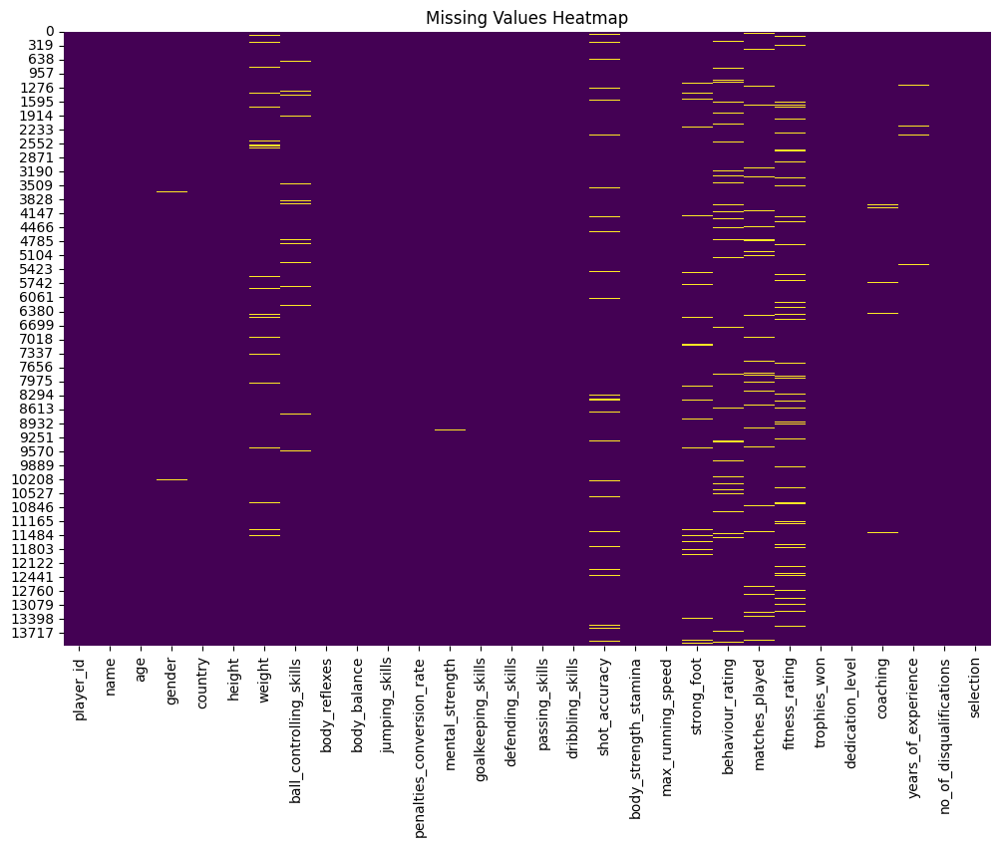

In [10]:
# Visualize missing values using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [19]:
# Exploratory Data Analysis (EDA) for numerical columns
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
numeric_cols

Index(['age', 'ball_controlling_skills', 'body_reflexes', 'body_balance',
       'jumping_skills', 'penalties_conversion_rate', 'mental_strength',
       'goalkeeping_skills', 'defending_skills', 'passing_skills',
       'dribbling_skills', 'shot_accuracy', 'body_strength_stamina',
       'max_running_speed', 'behaviour_rating', 'matches_played',
       'fitness_rating', 'trophies_won', 'years_of_experience',
       'no_of_disqualifications', 'selection'],
      dtype='object')

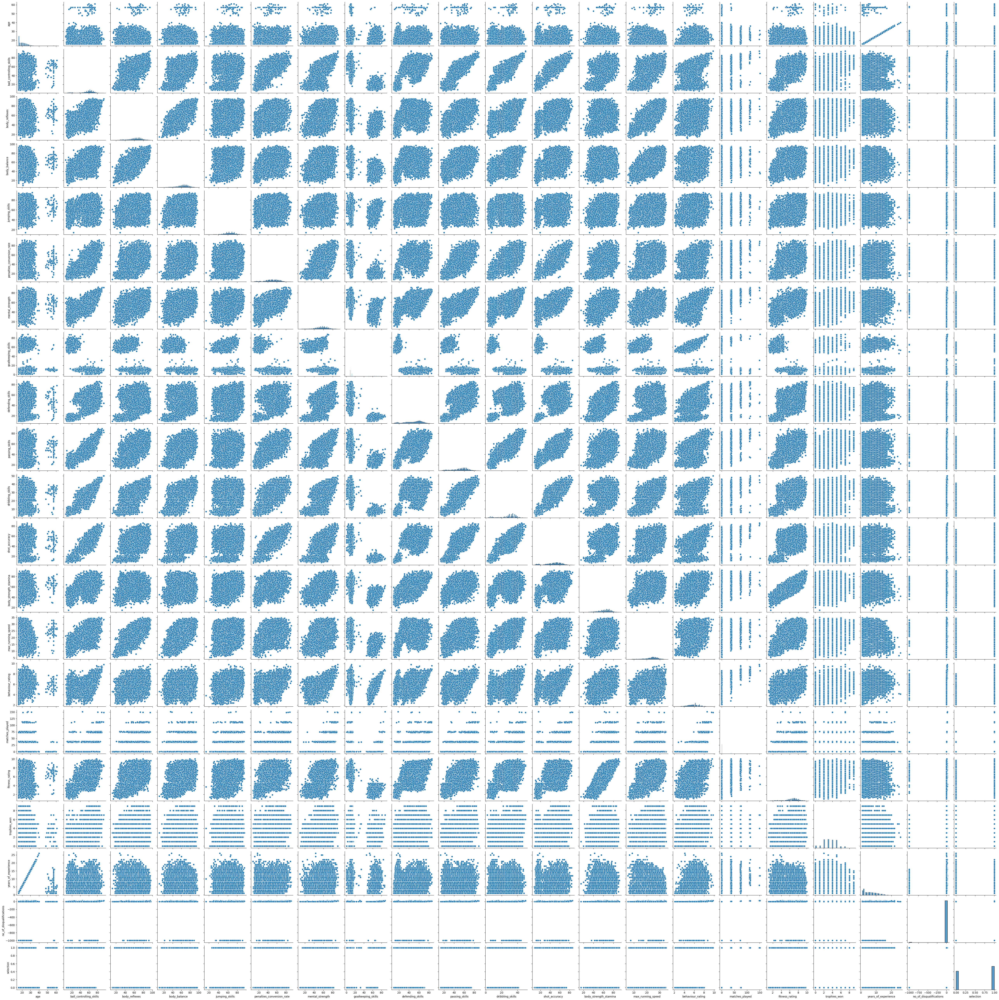

In [14]:
# Pairplot for numerical columns
sns.pairplot(data[numeric_cols])
plt.show()

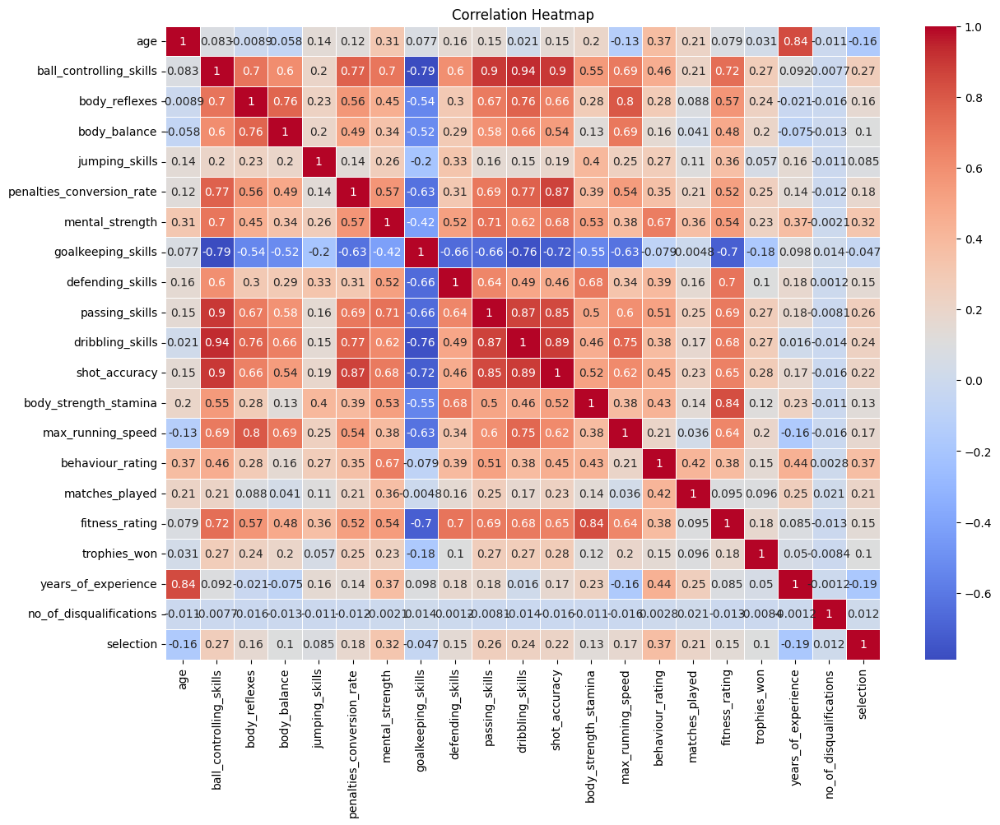

In [15]:
# Correlation heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(data[numeric_cols].corr(), annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

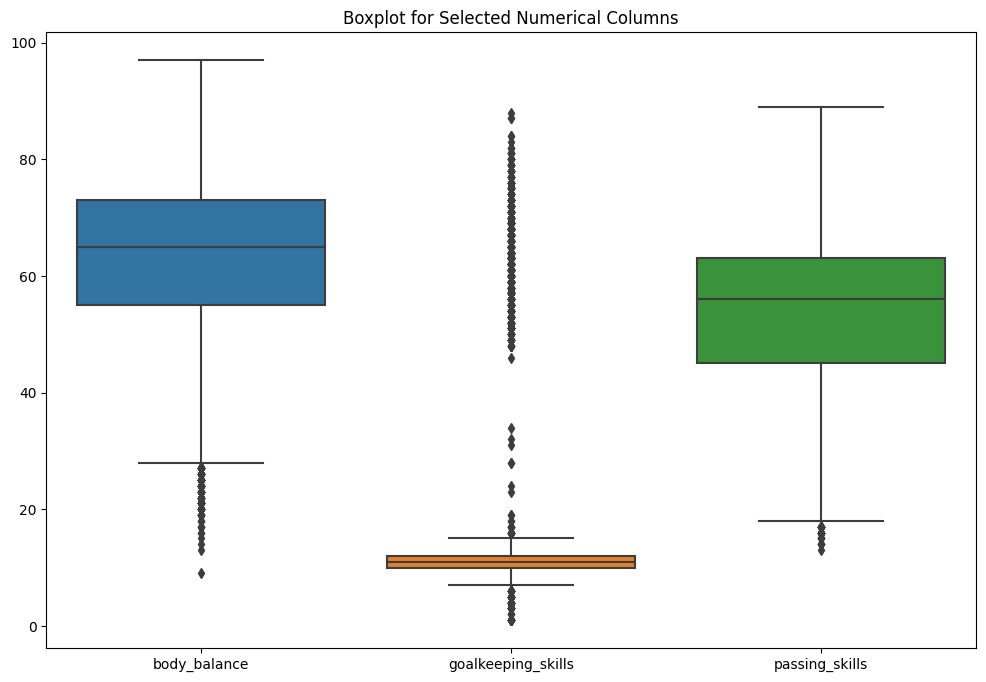

In [16]:
# Boxplot for selected numerical columns
selected_cols = ['body_balance', 'goalkeeping_skills', 'passing_skills']
plt.figure(figsize=(12, 8))
sns.boxplot(data=data[selected_cols])
plt.title('Boxplot for Selected Numerical Columns')
plt.show()

In [18]:
# Exploratory Data Analysis (EDA) for categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns
categorical_cols

Index(['player_id', 'name', 'gender', 'country', 'height', 'weight',
       'strong_foot', 'dedication_level', 'coaching'],
      dtype='object')

In [20]:
# Check for missing values
data.isnull().sum()

player_id                      0
name                           0
age                            0
gender                        19
country                        0
height                         0
weight                       417
ball_controlling_skills      413
body_reflexes                  0
body_balance                   0
jumping_skills                24
penalties_conversion_rate     30
mental_strength               28
goalkeeping_skills             0
defending_skills               0
passing_skills                 0
dribbling_skills               0
shot_accuracy                572
body_strength_stamina          0
max_running_speed              0
strong_foot                  552
behaviour_rating             703
matches_played               666
fitness_rating               695
trophies_won                   0
dedication_level               0
coaching                     125
years_of_experience          144
no_of_disqualifications        0
selection                      0
dtype: int

In [21]:
# Drop rows with missing values in 'gender'
df = data.dropna(subset=['gender'])

In [22]:
# Drop rows with missing values in specific columns
cols_with_missing_values = ['weight', 'ball_controlling_skills', 'jumping_skills',
                             'penalties_conversion_rate', 'mental_strength', 'shot_accuracy',
                             'strong_foot', 'behaviour_rating', 'matches_played',
                             'fitness_rating', 'coaching', 'years_of_experience']
df = data.dropna(subset=cols_with_missing_values)

In [25]:
# Impute missing values for numerical columns
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
imputer_numeric = SimpleImputer(strategy='mean')
data[numeric_cols] = imputer_numeric.fit_transform(data[numeric_cols])

In [26]:
# Impute missing values for categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns
imputer_categorical = SimpleImputer(strategy='most_frequent')
data[categorical_cols] = imputer_categorical.fit_transform(data[categorical_cols])

In [27]:
# Encode categorical variables
label_encoder = LabelEncoder()

In [28]:
# Encode 'strong_foot' column
data['strong_foot'] = label_encoder.fit_transform(data['strong_foot'])

In [29]:
# Encode 'dedication_level' column
data['dedication_level'] = label_encoder.fit_transform(data['dedication_level'])

In [30]:
# Handle categorical columns with more than two categories using one-hot encoding
data = pd.get_dummies(data, columns=['gender', 'coaching'])

In [32]:
# Standardize numerical columns
scaler = StandardScaler()
data[numeric_cols] = scaler.fit_transform(data[numeric_cols])

In [33]:
# Display the first few rows of the preprocessed dataset
print(data.head())

    player_id                 name       age    country height  weight  \
0   PLID_4964           Keva Horan  0.361093    Ukraine    6'2  176lbs   
1  PLID_11234           Herma Tann -0.607423     Russia   5'10  148lbs   
2  PLID_19127         Eilene Kizer -0.994830      Spain    6'2  172lbs   
3  PLID_17467       Andrea Badgett  1.135906      Chile   5'11  165lbs   
4   PLID_9661  Jeremiah Bumbalough -0.413720  Argentina    5'8  158lbs   

   ball_controlling_skills  body_reflexes  body_balance  jumping_skills  ...  \
0                 1.267208      -0.263493     -1.109144       -0.386654  ...   
1                -0.123598       0.473208      0.510217       -0.135146  ...   
2                -1.332995      -1.268085     -1.249958        0.451706  ...   
3                 1.388148       0.741099      0.932659        1.876919  ...   
4                -0.546887      -0.062575      0.791845       -0.554326  ...   

   dedication_level  years_of_experience  no_of_disqualifications  selecti

In [36]:
#to check the dataset info again
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13994 entries, 0 to 13993
Data columns (total 34 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   player_id                  13994 non-null  object 
 1   name                       13994 non-null  object 
 2   age                        13994 non-null  float64
 3   country                    13994 non-null  object 
 4   height                     13994 non-null  object 
 5   weight                     13994 non-null  object 
 6   ball_controlling_skills    13994 non-null  float64
 7   body_reflexes              13994 non-null  float64
 8   body_balance               13994 non-null  float64
 9   jumping_skills             13994 non-null  float64
 10  penalties_conversion_rate  13994 non-null  float64
 11  mental_strength            13994 non-null  float64
 12  goalkeeping_skills         13994 non-null  float64
 13  defending_skills           13994 non-null  flo

In [37]:
# Check for missing values again for a confirmation
data.isnull().sum()

player_id                    0
name                         0
age                          0
country                      0
height                       0
weight                       0
ball_controlling_skills      0
body_reflexes                0
body_balance                 0
jumping_skills               0
penalties_conversion_rate    0
mental_strength              0
goalkeeping_skills           0
defending_skills             0
passing_skills               0
dribbling_skills             0
shot_accuracy                0
body_strength_stamina        0
max_running_speed            0
strong_foot                  0
behaviour_rating             0
matches_played               0
fitness_rating               0
trophies_won                 0
dedication_level             0
years_of_experience          0
no_of_disqualifications      0
selection                    0
gender_F                     0
gender_M                     0
coaching_Academy             0
coaching_Source              0
coaching

Random Forest

In [38]:
# Import necessary libraries for model building
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [77]:
# Assuming 'selection' is the target variable, and  want to predict it
X = df.drop(['player_id', 'name', 'country', 'selection', 'coaching'], axis=1)  # Exclude non-numeric columns
y = df['selection']

# Handle 'height' column
X['height'] = X['height'].apply(lambda x: int(x.split("'")[0]) * 12 + int(x.split("'")[1]) if isinstance(x, str) and "'" in x else int(x))

# Handle 'weight' column
X['weight'] = X['weight'].apply(lambda x: int(x.split('lbs')[0]) if isinstance(x, str) and 'lbs' in x else int(x))

# Encode 'strong_foot' column
label_encoder = LabelEncoder()
X['strong_foot'] = label_encoder.fit_transform(X['strong_foot'])

# One-hot encode categorical columns
X = pd.get_dummies(X, columns=['gender', 'dedication_level'])



In [78]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a RandomForestClassifier
model = RandomForestClassifier(random_state=42)

In [79]:
# Train the model on the training set
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [80]:
# Make predictions on the testing set
y_pred = model.predict(X_test)

In [83]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.85


In [84]:
# Print classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       903
           1       0.87      0.87      0.87      1135

    accuracy                           0.85      2038
   macro avg       0.85      0.85      0.85      2038
weighted avg       0.85      0.85      0.85      2038



In [85]:
# Display confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix:')
print(conf_matrix)


Confusion Matrix:
[[751 152]
 [146 989]]


Decision Tree

In [87]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier  # Import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder


# Assuming 'selection' is the target variable, and need to predict it
X = df.drop(['player_id', 'name', 'country', 'selection', 'coaching'], axis=1)  # Exclude non-numeric columns
y = df['selection']

# Handle 'height' column
X['height'] = X['height'].apply(lambda x: int(x.split("'")[0]) * 12 + int(x.split("'")[1]) if isinstance(x, str) and "'" in x else int(x))

# Handle 'weight' column
X['weight'] = X['weight'].apply(lambda x: int(x.split('lbs')[0]) if isinstance(x, str) and 'lbs' in x else int(x))

# Encode 'strong_foot' column
label_encoder = LabelEncoder()
X['strong_foot'] = label_encoder.fit_transform(X['strong_foot'])

# One-hot encode categorical columns
X = pd.get_dummies(X, columns=['gender', 'dedication_level'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=42)

# Train the model on the training set
model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Print classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

# Display confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix:')
print(conf_matrix)


Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.76      0.77       903
           1       0.81      0.82      0.81      1135

    accuracy                           0.79      2038
   macro avg       0.79      0.79      0.79      2038
weighted avg       0.79      0.79      0.79      2038


Confusion Matrix:
[[687 216]
 [206 929]]


Fine tuning

In [91]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder


# Assuming 'selection' is the target variable,  to predict it
X = df.drop(['player_id', 'name', 'country', 'selection', 'coaching'], axis=1)  # Exclude non-numeric columns
y = df['selection']

# Handle 'height' column
X['height'] = X['height'].apply(lambda x: int(x.split("'")[0]) * 12 + int(x.split("'")[1]) if isinstance(x, str) and "'" in x else int(x))

# Handle 'weight' column
X['weight'] = X['weight'].apply(lambda x: int(x.split('lbs')[0]) if isinstance(x, str) and 'lbs' in x else int(x))

# Encode 'strong_foot' column
label_encoder = LabelEncoder()
X['strong_foot'] = label_encoder.fit_transform(X['strong_foot'])

# One-hot encode categorical columns
X = pd.get_dummies(X, columns=['gender', 'dedication_level'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize numerical columns
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a RandomForestClassifier
model = RandomForestClassifier(random_state=42)

# Define hyperparameters to tune
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt']
}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# Display the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Get the best model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the testing set using the best model
y_pred = best_model.predict(X_test_scaled)

# Evaluate the best model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy of the Best Model: {accuracy:.2f}')

# Print classification report for the best model
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

# Display confusion matrix for the best model
conf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix:')
print(conf_matrix)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Best Hyperparameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Accuracy of the Best Model: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       903
           1       0.86      0.87      0.87      1135

    accuracy                           0.85      2038
   macro avg       0.85      0.85      0.85      2038
weighted avg       0.85      0.85      0.85      2038


Confusion Matrix:
[[745 158]
 [142 993]]


In [93]:
# Display the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Get the best model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the testing set using the best model
y_pred = best_model.predict(X_test_scaled)

# Evaluate the best model
accuracy_percentage = accuracy_score(y_test, y_pred) * 100
print(f'Accuracy of the Best Model: {accuracy_percentage:.2f}%')


Best Hyperparameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Accuracy of the Best Model: 85.28%
